# <span style='color: red; font-size: 3rem'>DRAFT</span>

# Ajitsuke Tamago - The art of boiling eggs
### Steven Fowler <a id='headerlink' href="https://stevenafowler.github.io/diablothewonderdog/" target="_blank">(see more projects here)</a>

<img id = 'headerimage' src="assets/images/egg_image_header.png">

TODO: Size this image correctly

Ajitsuke Tamago, aka __Ramen eggs__, are one of my favorite additions to a hearty ramen bowl. These eggs have a thick treacly yoke with a soft custard like white that has been marinated. The hardest part of making these eggs is the cooking to get the right egg consistencies.

The goal of this investigation is to look model the cooking step of making Ajitsuke Tamago eggs and get an understanding of most sensitive parameter that need to be controlled to get a repeatable product.

## The chemistry of eggs

There are many publications on eggs, their chemistry and even modelling the boiling of eggs <sup>1, 2</sup>. In summary, the composition and transformation of cooking an egg is as follows:

Based on Hen eggs, the main areas of an egg consists of 3 key parts:

1. **Shell** - This is a porous structure mainly consisting of calcium carbonate and it accounts of 12% of an eggs mass.
2. **White** (albumen) - Multi-layered opalescent substance mainly consisting of 2 proteins (12% ovotransferrin, 54% ovalbumin). It accounts for 67% of the egg's mass.
3. **Yoke** - Contains fats, vitamins and < 50% of the egg's protein. It accounts for 33% of the egg's mass.

Other parts:
* **Inner and outer membrane** between shell and albumen.
* **Chalazae** - anchors the yoke in the centre of the egg.
* **Vitelline membrane** - between the yolk and albumen.
* **Air cell** - Generally forms at the larger end of the egg between the inner and outer membranes. It forms when the egg contracts after being laid.

### How the parts of an egg cook (or not)

The phase change of an egg (yolk and white) is due to a coagulation of denatured proteins within the egg. The proteins denature at different temperature ranges, aggregate and form gel like structures. Note: Proteins can also be denatured by other mechanisms (i.e. pH changes, mechanical action) but these are out-of-scope of this investigation. 

The phase changes of an egg are summarized in the below table (based on ref <sup>3</sup>):

| Temperature (°C) | White | Yolk |
| :--------------: | :---- | :--- |
| 63 | Partially set | Runny thickening |
| 65 - 70 | Soft set gel | Runny treacle |
| 73 | Largely set | Soft gel |
| 77 | Tender solid | Hard boiled |
| 80 | Firm | Onset green discoloration |
| 90 | Over cooked | Dry, crumbly solid |

A general recipe for Ajitsuke Tamago is as follows<sup>4</sup>:

1. Boil water (**100°C**)
2. Place egg in water and cook for **7 minutes**
3. Immerse egg in ice water (**0°C**)
4. Once cooled remove shells
5. Marinade eggs for 24 hrs

## Modelling requirements

Based on the above understanding, an Ajitsuke Tamago requires:

| ID_req  | Requirement | Criteria | 
| :-: | :---------- | :------- |
|  1  | Yolk temperature shall not exceed 70°C to keep yolk runny  | max(yolk temperature) =< 70°C  |
|  2  | Yolk temperature shall exceed 65°C to thicken the yolk     | mean(yolk temperature) > 65°C  |
|  3  | White temperature shall not overly exceed 80°C to prevent onset of discoloration | mean(white temperature) =< 80°C |

<br>

___

# Modelling Ajitsuke Tamago

The section provides an overview of the model used to simulate the Ajitsuke Tamago cooking. There are more detailed noted in the appendix. In summary, the following is covered:

* An overview of the maths deriving the model
* The creation of the mesh for the model
    - Defining the egg shape and areas of interest
    - Creating the mesh (diffusion coefficient array)
* The implementation of the model using the mesh

## Overview of modelling math

To model the cooking of an egg, a general diffusion model was implemented to simulate the heat transfer in the system. A 2D diffusion type system in has the general form of:
$$
    \frac{\delta u}{\delta t} = \alpha (\frac{\delta^2 u}{\delta x^2} + \frac{\delta^2 u}{\delta i^2}) 
$$
where $u(x,i,t)$ is the function to be solved, $j$ and $i$ are  cartesian coordinates and t is time. $\alpha$ is the diffustion coefficient and determines the rate change in $u$ in $t$.

Based on finite differences (see appendix for detailed notes), this can be expressed as:
$$ 
    u_i^{n+1} = u_{i,j}^n + F_x(u_{i+1,j}^n - 2u_{i,j}^n + u_{i-1,j}^n) + F_y(u_{i,j+1}^n - 2u_{i,j}^n + u_{i,j-1}^n)
$$
where
$$
    F_x = \alpha \frac{\Delta t}{\Delta j^2}, F_y = \alpha \frac{\Delta t}{\Delta i^2}
$$
> [!Note]
> $F$ is the __Fourier Number__, a dimensionless value that represents the physical parameters of the diffusion problem in $\alpha$ and the discretized parameters $\Delta j$ and $\Delta t$.

Note the time domain is defined as:
$$
    t_n = n \Delta t, n = 0,...,N_t
$$
with the space domain as:
$$
    x_i = i\Delta x, i = 0,...,N_x, 
$$
$$
    y_j = j\Delta i, j = 0,...,N_y
$$

## Modelling Mesh

The standard mesh for a finite difference problem is a cartesian grid. Although there is the option to make more complex or dynamic meshes, if this is needed to capture the detail in an simulation then an FEA approach is probably more desirable. However, if we assume that the relatively high diffusion coefficient (≈ x10 greater than yolk and white) and a thickness of ≈0.3 mm of the shell has little its influence on the overall heat transfer, it can be ignored. So, the overall model consists of 2 parts: the white and the yolk.

### Egg shape

The shape of the egg based on the model from Lian et al<sup>5</sup>, where the parametric form is:
$$
    y_p=asin\theta
$$
$$
    x_p=bcos\theta(1+c_1sin\theta+c_2sin^2\theta+c_3sin^3\theta)
$$
where $y_p$ and $x_p$ are the coordinates of the egg profile (2D); $\theta$ is the eccentric angle; $a$ the half length; $b$ approximate half width; $c_1,c_2,c_3$ are parameters to be adjusted to fit an egg shape.

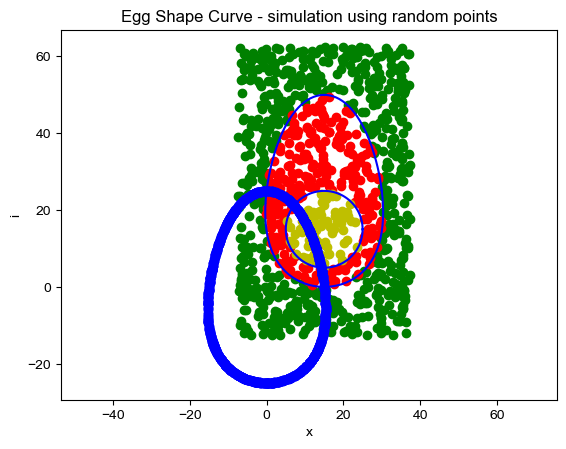

In [3]:
# Egg shape curve
# A parametric equation to generate an egg shape curve
# Reference: Comparison of egg-shape equations using relative curvature measures of nonlinearity, Lian et al., 2024

import numpy as np
import matplotlib.pyplot as plt

def egg_shape(half_width, half_height, t, c1, c2, c3 , x_axis_offset=0, y_axis_offset=0):
    x = (half_width * np.cos(t)) * (1 + c1*np.sin(t) + c2*np.sin(t)**2 + c3*np.sin(t)**3) + x_axis_offset
    i = half_height * np.sin(t) + y_axis_offset
    return x, i

def find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , t, x_axis_offset, y_axis_offset):
    egg_x, egg_y = egg_shape(half_width, half_height, t, c1, c2, c3, 0, 0)
    err = np.atan2(point_y - y_axis_offset, point_x - x_axis_offset) - np.atan2(egg_y, egg_x)
    # print("point: %f, %f - egg: %f, %f - err:, %f - theta: %f, %f"%(point_x, point_y, egg_x, egg_y, err, t, np.atan2(egg_y, egg_x)))
    # print("theta guess: ", np.atan2(point_y - y_axis_offset, point_x - x_axis_offset))
    return err, egg_x, egg_y

def find_theta_of_egg(point_x, point_y, half_width, half_height, c1 , c2 , c3 , x_axis_offset, y_axis_offset):
    # Bisection method t = theta = atan2(i, x)
    a = 0
    b = np.pi 
    err_a = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , a, x_axis_offset, y_axis_offset)[0]
    err_b = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , b, x_axis_offset, y_axis_offset)[0]
    
    if np.sign(err_a)  == np.sign(err_b):
        # print("err_a: ", err_a, "a: ", a, "err_b: ", err_b, "b: ", b)
        b = -np.pi
        err_b = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , b, x_axis_offset, y_axis_offset)[0]
        if np.sign(err_a)  == np.sign(err_b):
                # print("err_a: ", err_a, "a: ", a, "err_b: ", err_b, "b: ", b)
                raise Exception("Bisection method requires a sign change over the interval.")
    
    count = 0
    while True:
        m = (a + b) / 2
        err_m, egg_x, egg_y = find_error_at_t(point_x, point_y, half_width, half_height, c1 , c2 , c3 , m, x_axis_offset, y_axis_offset)

        if np.abs(err_m) < 1e-14:
            # print("Converged in ", count, " iterations with error ", err_m)
            return m, egg_x, egg_y
        elif np.sign(err_a) == np.sign(err_m):
            a = m
            err_a = err_m
        else:
            b = m
            err_b = err_m
        
        count += 1
        if count >= 1000:
            print("Error: ", err_m)
            raise Exception("Bisection method did not converge within 1000 iterations.")

def point_within_egg(point_x, point_y, half_width, half_height, c1 , c2 , c3 , x_axis_offset, y_axis_offset):

    # Find a theta of the egg shape that matches the theta of the point
    egg_theta, egg_x, egg_y = find_theta_of_egg(point_x=point_x, point_y=point_y, half_width=half_width, half_height=half_height,
                                                c1=c1, c2=c2, c3=c3, x_axis_offset=x_axis_offset, y_axis_offset=y_axis_offset)
    # Get egg shape X, Y that intersects egg_theta
    # egg_x, egg_y = egg_shape(half_width, half_height, egg_theta, c1=c1, c2=c2, c3=c3, x_axis_offset=0, y_axis_offset=0)
    # egg_x, egg_y = egg_shape(half_width, half_height, egg_theta, c1, c2, c3, 0, 0)
    # print("theta point: ", np.atan2(point_y - y_axis_offset, point_x - x_axis_offset), ", theta of egg_cor: ", np.atan2(egg_y, egg_x), ", theta: ", egg_theta)
    # print("egg x,i: ", egg_x, ", ", egg_y, " theta: ", np.atan2(egg_y, egg_x), " theta cor: ", egg_theta)

    # Return if point is within egg shape
    return ((point_x - x_axis_offset)**2 + (point_y - y_axis_offset)**2) <= (egg_x**2 + egg_y**2), egg_x, egg_y


def yoke_shape(x_axis_offset, y_axis_offset, a, b, t):
    x = x_axis_offset + a*np.cos(t)
    i = y_axis_offset + b*np.sin(t)
    return x, i

###
#
# Testing egg shape functions and allocation of points

t = np.linspace(0, 2*np.pi, 100)
# Egg parameters
width = 15
height = 25
c1 = -0.2
c2 = 0.1
c3 = 0.0
x_shift = width
y_shift = height
# Yoke parameters
a = 10
b = 10
x_shift_yoke = x_shift
y_shift_yoke = y_shift - 10

x, y = egg_shape(width, height, t, c1=c1, c2=c2, c3=c3, x_axis_offset=x_shift, y_axis_offset=y_shift)
x_yoke, y_yoke = yoke_shape(x_shift_yoke, y_shift_yoke, a, b, t)

x_test = np.random.rand(1000) * width * 3 - 0.5 * width
y_test = np.random.rand(1000) * height * 3 - 0.5 * height

# x_test = np.ones(1) * 5
# y_test = np.ones(1) * 5

point_in_egg = np.zeros_like(x_test, dtype=bool)
point_in_york = np.zeros_like(x_test, dtype=bool)
x_egg_chk = np.zeros_like(x_test)
y_egg_chk = np.zeros_like(x_test)
for i in range(len(x_test)):
    point_in_egg[i], x_egg_chk[i], y_egg_chk[i] = point_within_egg(x_test[i], y_test[i], width, height, 
                                       c1 , c2 , c3 , 
                                       x_shift, y_shift)
    # Need to fix this for an ellipse not circle
    point_in_york[i] = ((x_test[i] - x_shift_yoke)**2 + (y_test[i] - y_shift_yoke)**2)**0.5 <= (a)
    

plt.plot(x_test[np.where(np.invert(point_in_egg))], y_test[np.where(np.invert(point_in_egg))], 'go')  # Plot test points
plt.plot(x_test[np.where(point_in_egg != point_in_york)], y_test[np.where(point_in_egg != point_in_york)], 'ro')  # Plot test points
plt.plot(x_test[np.where(point_in_york)], y_test[np.where(point_in_york)], 'yo')  # Plot test points
plt.plot(x_egg_chk, y_egg_chk, 'bo')  # Plot test points
plt.plot(x, y, 'b-')
plt.plot(x_yoke, y_yoke, 'b-')
plt.title('Egg Shape Curve - simulation using random points')
plt.xlabel('x')
plt.ylabel('i')
plt.axis('equal')
plt.style.use('seaborn-v0_8-whitegrid')
plt.show()


<p style="text-align: center; font-style: italic; font-size: 14px">
    <b style="color: #d9230f">Figure 1. Illustration of egg shape fitting function.</b><br>
    The blue line shows the egg like shape that has been generated by the function. Randomly generated points are allocated to the specific area of the array/image: Yellow points are within the yolk; Red points are within the white and; green points are outside the egg shape. The blue points are those on the same vector as the randomly generated points (plotted from the origin).
</p>

The above plot shows the egg shape using fictional parameters to simulate an egg. The point in the plot are randomly generated and color-assigned depending on where are in the egg. This approach will be used to generate the mesh and thermal diffusion coefficient array for the modelling.

### Define thermal diffusion coefficient array

The model will be defined by an array of varying diffusion coefficients that represent each area of the egg (white and yolk). Using the functions defined in the above section, the parameters of the egg fitting function were adjusted to fit measured data (see table below) and the yolk size was estimated based on the mass of the white and yolk (yolk being ≈33% of white + yolk area).

Three measures were sampled on medium sized supermarket eggs. The parameters of the egg shape equation were then adjusted to fit these measurements.

| Measurement           | distance (mm) |
| :-------------------- | :---: |
| Max width             | 45.8  |
| Heigh of 'max width'  | 25    |
| Max height            | 55.8  |

The thermal properties of the egg were found in publications (see table below). However, as can be seen in the table the quoted magnitude of these properties varies considerably.

| Egg part | Reference | Density (Kg.cm<sup>-3</sup>) | Conductivity (W.m<sup>-1</sup>.K<sup>-1</sup>) | Capacity (J.Kg<sup>-1</sup>.K<sup>-1</sup>) |
| :------- | :-------: | :--------------------------: | :--------------------------------------------: | :---------------------------------------: |
| Yolk      |   6   |   1028    |   0.54    |   3700    |
| Yolk      |   7   |   1100    |   0.31    |   3700    |
| Yolk*     |   8   |   1036    |   0.34    |   2093    |
| Yolk*     |   8   |   1036    |   0.34    |   3266    |
| Yolk      |   9   |   N/A     |   0.34    |   3180    |
| Yolk      |   10  |   1032    |   0.34    |   2700    |
| White     |   7   |   1134    |   0.48    |   3800    |
| White*    |   8   |   1036    |   0.59    |   2093    |
| White*    |   8   |   1036    |   0.59    |   3935    |
| White     |   9   |   N/A     |   0.58    |   3180    |
| White     |   10  |   1038    |   0.54    |   3700    |

For the purposes of this model, the values from reference [11] were chosen:

| Egg part | Density (Kg.cm<sup>-3</sup>) | Conductivity (W.m<sup>-1</sup>.K<sup>-1</sup>) | Capacity (J.Kg<sup>-1</sup>.K<sup>-1</sup>) | Diffusion (mm<sup>2</sup>.s<sup>-1</sup>) |
| :------- | :--------------------------: | :--------------------------------------------: | :---------------------------------------: | :---: |
| Yolk     | 1032    |   0.34    |   2700    | 0.12 |
| White    | 1038    |   0.54    |   3700    | 0.14 |

</br>
* Reference [8] quotes a range of values, hence there are 2 rows for each egg part.

yolk to white ratio: 0.33


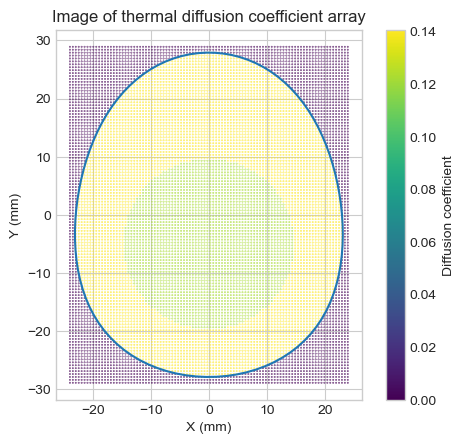

In [4]:
import math
import numpy as np

def round_up_to_nearest_odd(value):
    round_up_value = math.ceil(value)
    if round_up_value % 2 == 0:
        return int(round_up_value +1)
    else:
        return int(round_up_value)
    
# Make diffusion grid

# Model definition
egg_width = 45.8      # mm
egg_height = 55.8     # mm
egg_c1 = -0.1       # Shape parameter 1st order
egg_c2 = 0.1        # Shape parameter 2nd order
egg_c3 = 0.0        # Shape parameter 3rd order
white_alpha = 0.14060303077644118     # Egg white coefficient of diffusion
yoke_width = egg_width * 0.41**0.5     # mm
yoke_height = yoke_width    # mm, assume round for now - can implement ellipse later if needed
yoke_center = -5    # mm, height from base off egg
yoke_alpha  =0.1220212460522538   # Egg yoke coefficient of diffusion

# Mesh definition
dx = 0.5     # mm per node
dy = dx
# # mesh_width: odd value puts line of node at line of symmetry, +1 is for boundary conditions at 0 & n
# mesh_width = round_up_to_nearest_odd(egg_width / dx + 1)   
# mesh_height = round_up_to_nearest_odd(egg_height / dy + 1)

mesh_X_mm = np.linspace(-egg_width/2 - 1, egg_width/2 + 1, int(np.ceil((egg_width + 2)/dx)))
mesh_Y_mm = np.linspace(-egg_height/2 - 1, egg_height/2 + 1, int(np.ceil((egg_height + 2)/dx)))

# mesh_X_mm = np.linspace(-egg_width/2 - 1, egg_width/2 + 1, (egg_width + 2)*dx)
# mesh_Y_mm = np.linspace(-egg_height/2 - 1, egg_height/2 + 1, (egg_width + 2)*dy)

# Diffusion grid
X, Y = np.meshgrid(mesh_X_mm, mesh_Y_mm, indexing='ij')
alpha_grid = np.zeros_like(X)
boundary_coord = []
white_coord = []
yolk_coord = []

for i in range(np.size(alpha_grid,0 )):
    for j in range(np.size(alpha_grid, 1)):
        # Check if point in yoke
        point_in_yoke = (X[i, j]**2 + (Y[i, j] - yoke_center)**2) <= (yoke_width/2)**2
        if point_in_yoke:
            # alpha_grid[i, j] = yoke_alpha
            yolk_coord.append((i, j))
        else:
            # Check if point in white
            point_in_egg, e1, e2 = point_within_egg(X[i, j], Y[i, j], egg_width/2, egg_height/2,
                                                    egg_c1, egg_c2, egg_c3, 
                                                    0, 0)
            if point_in_egg:
                # alpha_grid[i, j] = white_alpha
                white_coord.append((i, j))
            else:
                boundary_coord.append((i, j))

boundary_coord = np.array(boundary_coord)
white_coord = np.array(white_coord)
yolk_coord = np.array(yolk_coord)

print(f"yolk to white ratio: {np.size(yolk_coord,0) / (np.size(white_coord,0) + np.size(yolk_coord,0)):.2f}")

i, j = egg_shape(egg_width/2, egg_height/2,
                 np.linspace(0, 2*np.pi, 100),
                 egg_c1, egg_c2, egg_c3,
                 0, 0)

alpha_grid[yolk_coord[:, 0], yolk_coord[:, 1]] = yoke_alpha
alpha_grid[white_coord[:, 0], white_coord[:, 1]] = white_alpha
alpha_grid[boundary_coord[:, 0], boundary_coord[:, 1]] = 0

# np.put(alpha_grid, np.ravel_multi_index(yolk_coord.T, alpha_grid.shape), diffusion_coefficient(25, yolk))

fig, ax = plt.subplots()
ax.set_aspect('equal')
scatter = ax.scatter(X, Y, c=alpha_grid, cmap='viridis', s=0.1)
fig.colorbar(scatter, ax=ax, label='Diffusion coefficient')
ax.plot(i, j)
ax.set_title('Image of thermal diffusion coefficient array')
ax.set_xlabel('X (mm)')
ax.set_ylabel('Y (mm)')
plt.show()



<p style="text-align: center; font-style: italic; font-size: 14px">
    <b style="color: #d9230f">Figure 2. Illustration of diffusion coefficient array.</b><br>
    This plot shows the nodes of the cartesian mesh, where the colour of the node represents the magnitude of the diffusion coefficient. The blue line highlights the boundary of the egg. Note: point with 0 diffusion coefficient (dark purple) are the boundary nodes.
</p>

The above image illustrates the diffusion array for the model. Outside of the egg is the boundary nodes with a coefficient of 0, the yellow (≈0.11 mm<sup>2</sup>s<sup>-1</sup>) is the white and green (≈0.08 mm<sup>2</sup>s<sup>-1</sup>) is the yolk. The origin is at the centre of the egg-shape function and there is a 0.5 mm resolution.

## Finite-difference model

A generic model for finite differences was drafted (see appendix) for solving general diffusion problem. However, for this investigation an diffusion coefficient array was needed to define the circular egg shape (without using polar coordinate system) and to look at the requirements the heating temperature needed to be dynamic. Hence, the below $ ajitsuke_egg_simulation $ function was written.

Criteria to investigate requirements
* Geometrically defined diffusion coefficients
* Dynamic heating (control of boundary conditions)
* Max temp monitoring (logic to drive heating temperature)
* Mean yolk monitoring (logic to drive heating temperature)

### Model assumptions

| ID_ma  | Assumption |
| :----: | :--------- |
|  1     | Diffusion coefficients are constant throughout process </br>(see appendix - this is not true) |
|  2     | The error in the finite-difference approach is within the </br>noise of the system |
|  3     | The egg shape defined in the coefficient array is representative </br>of a general egg (small samples numbers measured) | 
|  4     | A uniform boundary condition will give representative results </br> i.e. ignoring the dynamics of the boiling water |
|  5     | ... 

In [5]:

import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.cm as cm
import time as time
from IPython.display import HTML
import numpy as np

def ajitsuke_egg_simulation(dt, nt, dx, dy, alpha_grid, 
                            heat_rate, mean_yolk_temp_switch, max_yolk_temp_switch,
                            boundary_T_cool, boundary_T_max, boundary_T_initial,
                            egg_T_initial, boundary_coord, yolk_coord, white_coord):
    
    start_time = time.time()

    nx = np.size(alpha_grid, 0)
    ny = np.size(alpha_grid, 1)

    # Check stability condition - using max alpha for worst case
    if dt > (dx**2 * dy**2) / (2 * alpha_grid.max() * (dx**2 + dy**2)):
        dt_max = (dx**2 * dy**2) / (2 * alpha_grid.max() * (dx**2 + dy**2))
        alpha_max = (dx**2 * dy**2) / (2 * dt * (dx**2 + dy**2))
        raise ValueError("Time step size dt is too large for stability. Maximum dt: ", dt_max, " or reduce alpha to: ", alpha_max)


    # Set initial conditions
    boundary_T_current = boundary_T_initial
    u0 = np.empty_like(alpha_grid) 
    u0[boundary_coord[:, 0], boundary_coord[:, 1]] = boundary_T_current
    u0[white_coord[:, 0], white_coord[:, 1]] = egg_T_initial
    u0[yolk_coord[:, 0], yolk_coord[:, 1]] = egg_T_initial

    # Boundary conditions with time
    cool = True
    mean_yolk = None
    mean_white = None
    u = np.empty((nt, nx, ny))  # Initialize the solution array
    u[0, :, :] = u0  # Set initial condition
    for n in range(1, nt):
        
        mean_yolk = np.mean(u[n-1, yolk_coord[:, 0], yolk_coord[:, 1]])
        max_yolk = np.max(u[n-1, yolk_coord[:, 0], yolk_coord[:, 1]])
        mean_white = np.mean(u[n-1, white_coord[:, 0], white_coord[:, 1]])
        print(f"Mean yolk: {mean_yolk:.2f}, Mean white: {mean_white:.2f} - after {dt*n:.2f} seconds\r", end='')
        
        # Cut off heat source when requirement 2 is met (mean_yolk_temp_switch)
        if ((mean_yolk >= mean_yolk_temp_switch) or (max_yolk >= max_yolk_temp_switch)) and (cool):
            # u0[boundary_coord[:, 0], boundary_coord[:, 1]] = 0
            # u[n, boundary_coord[:, 0], boundary_coord[:, 1]] = 0
            boundary_T_current = boundary_T_cool
            u[n-1, boundary_coord[:, 0], boundary_coord[:, 1]] = boundary_T_current
            cool = False
            print(f"Temperature changed! - Mean yolk: {mean_yolk:.2f}, Mean white: {mean_white:.2f} - after {dt*n:.2f} seconds")

        # Cap heating to boundary_T_max
        if (boundary_T_current < boundary_T_max) & (cool):
            boundary_T_current += heat_rate
            u[n-1, boundary_coord[:, 0], boundary_coord[:, 1]] = boundary_T_current

        # Boundary condition check
        u[n, boundary_coord[:, 0], boundary_coord[:, 1]] = boundary_T_current

        # Iterate over internal grid points
        for i in range(1, nx-1):    
            for j in range(1, ny-1):
                u[n, i, j] = (u[n-1, i, j] + 
                            alpha_grid[i, j] * dt * ((u[n-1, i+1, j] - 2*u[n-1, i, j] + u[n-1, i-1, j]) / dx**2 +
                                                    (u[n-1, i, j+1] - 2*u[n-1, i, j] + u[n-1, i, j-1]) / dy**2))
                
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Mean yolk: {mean_yolk:.2f}, Mean white: {mean_white:.2f} - after {dt*n:.2f} seconds")
    print(f"Elapsed time for solution: {elapsed_time:.2f} seconds.\n Time simulated: {dt * nt:.2f} seconds.")

    return u

# Simulation
TODO: intro notes

## Over cooking - constant heating

As initial look at the model, heating of the egg from room temperature (20°C) with an constant boundary condition of 100°C (boiling water) will be simulated.

In [94]:
dt = 0.035
nt = 35000 #8600

mean_yolk_temp_switch = 1000    # Too high to trigger
max_yolk_temp_switch = 1000     # Too high to trigger
boundary_T_cool = 0
boundary_T_max = 100
egg_T_initial = 20

###
heat_rate = 0 * dt
boundary_T_initial = 100
data_100 = ajitsuke_egg_simulation(dt, nt, dx, dy, alpha_grid, 
                                heat_rate, mean_yolk_temp_switch, max_yolk_temp_switch, 
                                boundary_T_cool, boundary_T_max, boundary_T_initial,
                                egg_T_initial, boundary_coord, yolk_coord, white_coord)

# Save for later access without needing to re-run simulation
np.save("egg_100_heating", data_100)

Mean yolk: 76.34, Mean white: 91.49 - after 1224.97 seconds
Elapsed time for solution: 721.32 seconds.
 Time simulated: 1225.00 seconds.


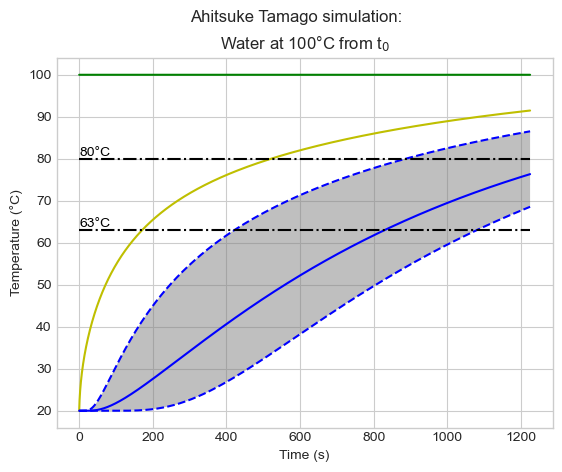

In [6]:
from matplotlib import collections  as mc

###
# Option to load data rather than re-running simulation
###
# dt = 0.035
# data_100 = np.load("egg_100_heating.npy")

# TODO: Write plotting function based on below to tidy code and uniform plots

x = np.zeros(np.size(data_100, 0))
y_label = ["boundary T", "mean white T", "mean yolk T", "min yolk T", "max yolk T", "max_white_T"]
y_colour = ["g-", "y-", "b-", "b--", "b--", "w "]
y_100 = np.zeros((np.size(y_label), np.size(x)))

for n in range(np.size(x)):
    x[n] = n * dt
    y_100[0, n] = np.mean(data_100[n, boundary_coord[:, 0], boundary_coord[:, 1]])
    y_100[1, n] = np.mean(data_100[n, white_coord[:, 0], white_coord[:, 1]])
    y_100[2, n] = np.mean(data_100[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_100[3, n] = np.min(data_100[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_100[4, n] = np.max(data_100[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_100[5, n] = np.max(data_100[n, white_coord[:, 0], white_coord[:, 1]])

fig, ax = plt.subplots()

for n in range(np.size(y_label)):
    ax.plot(x, y_100[n], y_colour[n], label=y_label[n])

ax.fill_between(x, y_100[3], y_100[4], facecolor='grey', alpha=0.5)

ax.hlines([63, 80], xmin=np.min(x), xmax=np.max(x), colors='k', linestyles='-.')
plt.text(0, 63, '63°C', verticalalignment='bottom', horizontalalignment='left', color='k')
plt.text(0, 80, '80°C', verticalalignment='bottom', horizontalalignment='left', color='k')
 
ax.set_title('Water at 100°C from t$_0$')
ax.set_xlabel('Time (s)')
ax.set_ylabel('Temperature (°C)')

# plt.tight_layout()
fig.suptitle('Ahitsuke Tamago simulation:')
plt.show()

<p style="text-align: center; font-style: italic; font-size: 14px">
    <b style="color: #d9230f">Figure 3. Simulation of boiling egg at 100°C for > 1200 seconds.</b><br>
    TODO: Update - Green is boundary condition (temperature of water cooking egg); Yellow is the mean temperature of the white; Blue is the mean (solid), max and min (dashed) yolk temperature. Grey area highlights temperature range of yolk. Black dash-dot lines are at: 63°C and 80°C.
</p>

In [7]:
# Useful numbers for discussion below...
time_reach_63 = x[np.argmax(y_100[4] >= 63)]

print("Data points of interest...\n")
print(f"\tx Yolk starts to heat (T > 21°C) at: {x[np.argmax(y_100[4] > 21)]:.2f} seconds")
print(f"\tx Yolk-white interface reaches 63°C: {time_reach_63:.2f} seconds ({time_reach_63/60:.1f} minutes)")
print(f"\tx Mean Yolk temperature when yolk-white interface at 63°C: {y_100[2, np.argmax(x >= time_reach_63)]:.2f}°C")
print(f"\tx Mean White temperature when yolk-white interface at 63°C: {y_100[1, np.argmax(x >= time_reach_63)]:.2f}°C")
print(f"\tx Max White temperature when yolk-white interface at 63°C: {y_100[5, np.argmax(x >= time_reach_63)]:.2f}°C")

Data points of interest...

	x Yolk starts to heat (T > 21°C) at: 38.64 seconds
	x Yolk-white interface reaches 63°C: 421.30 seconds (7.0 minutes)
	x Mean Yolk temperature when yolk-white interface at 63°C: 41.97°C
	x Mean White temperature when yolk-white interface at 63°C: 76.90°C
	x Max White temperature when yolk-white interface at 63°C: 99.22°C


From the above plot it can be seen that the yolk does not start to heat for 39 seconds, it them reaches 63°C at 7 minutes. This is a nice alignment as the recipe for cooking the Ajitsuke Tamago stated a 7 minutes cooking time and reference [6] [10] defines it's egg simulation complete when the yolk-white interface reaches 63°C. When the yolk-white interface reaches 63°C the mean white temperature is at 77°C, which is below at the 'tender' hardness (firm is at 80°C).

## Heating rate to meet requirements
TODO: Check ref. 10
As discussed above, reference [6] [10] assumed that the egg is cooked when the yolk-white interface reached 63°C. Consequently, for the next simulations when this condition is met the boundary condition will be dropped to 0°C simulated the egg being submerged in ice water. 

3 differing heating scenarios will be modelled:

* Scenario 1 - Starting with boiling water (reference)
* Scenario 2 - Starting at 20°C and heating to 100°C at a rate of **0.50°C.s<sup>-1</sup>**
* Scenario 3 - Starting at 20°C and heating to 100°C at a rate of **0.25°C.s<sup>-1</sup>**

This is to simulate the egg being present as the water is boiled.

In [102]:
dt = 0.035
nt = 35000 #8600
# dx
# dy
# alpha_grid    # Defines dimensions of problem
heat_rate = 0.5 * dt
mean_yolk_temp_switch = 100  # Requirement 2
max_yolk_temp_switch = 63
boundary_T_cool = 0
boundary_T_max = 100
boundary_T_initial = 20
egg_T_initial = 20
# boundary_coord
# yolk_coord
# white_coord

###
data_050 = ajitsuke_egg_simulation(dt, nt, dx, dy, alpha_grid, 
                                heat_rate, mean_yolk_temp_switch, max_yolk_temp_switch, 
                                boundary_T_cool, boundary_T_max, boundary_T_initial,
                                egg_T_initial, boundary_coord, yolk_coord, white_coord)

np.save("egg_050_heating", data_050)

###
heat_rate = 0.25 * dt
data_025 = ajitsuke_egg_simulation(dt, nt, dx, dy, alpha_grid, 
                                heat_rate, mean_yolk_temp_switch, max_yolk_temp_switch,
                                boundary_T_cool, boundary_T_max, boundary_T_initial,
                                egg_T_initial, boundary_coord, yolk_coord, white_coord)

np.save("egg_025_heating", data_025)

###
heat_rate = 0 * dt
boundary_T_initial = 100
data_000 = ajitsuke_egg_simulation(dt, nt, dx, dy, alpha_grid, 
                                heat_rate, mean_yolk_temp_switch, max_yolk_temp_switch, 
                                boundary_T_cool, boundary_T_max, boundary_T_initial,
                                egg_T_initial, boundary_coord, yolk_coord, white_coord)

np.save("egg_000_heating", data_000)

Temperature changed! - Mean yolk: 42.09, Mean white: 76.91 - after 504.00 seconds
Mean yolk: 26.27, Mean white: 9.93 - after 1224.97 secondss
Elapsed time for solution: 758.00 seconds.
 Time simulated: 1225.00 seconds.
Temperature changed! - Mean yolk: 42.46, Mean white: 76.89 - after 592.38 seconds
Mean yolk: 29.10, Mean white: 11.24 - after 1224.97 seconds
Elapsed time for solution: 736.24 seconds.
 Time simulated: 1225.00 seconds.
Temperature changed! - Mean yolk: 41.97, Mean white: 76.90 - after 421.33 seconds
Mean yolk: 23.93, Mean white: 8.91 - after 1224.97 secondss
Elapsed time for solution: 746.11 seconds.
 Time simulated: 1225.00 seconds.


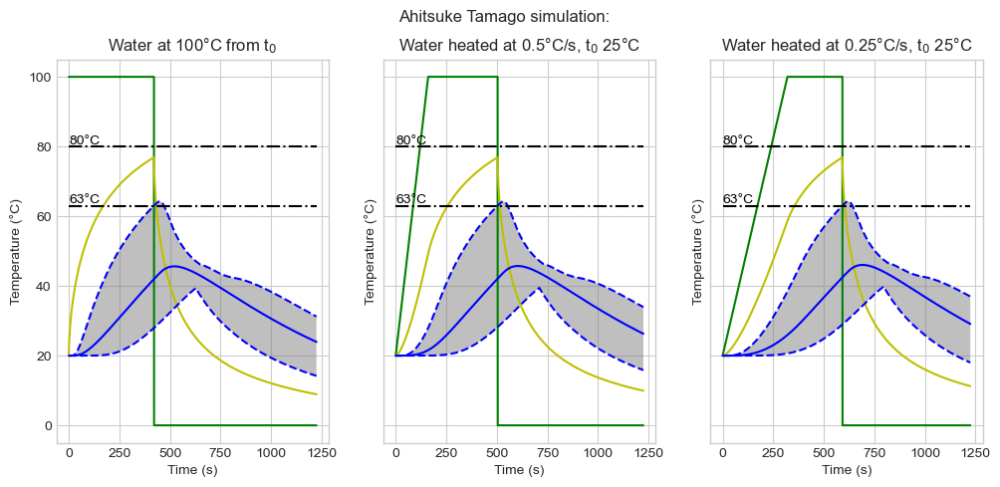

In [8]:
from matplotlib import collections  as mc

###
# Option to load data rather than re-running simulation
###
# dt = 0.035
# data_050 = np.load("egg_050_heating.npy")
# data_025 = np.load("egg_025_heating.npy")
# data_000 = np.load("egg_000_heating.npy")

# TODO: Use plotting function

x = np.zeros(np.size(data_000, 0))
y_label = ["boundary T", "mean white T", "mean yolk T", "min yolk T", "max yolk T", "max_white_T"]
y_colour = ["g-", "y-", "b-", "b--", "b--", "w "]
y_000 = np.zeros((np.size(y_label), np.size(x)))
y_050 = np.zeros((np.size(y_label), np.size(x)))
y_025 = np.zeros((np.size(y_label), np.size(x)))

for n in range(np.size(x)):
    x[n] = n * dt
    y_000[0, n] = np.mean(data_000[n, boundary_coord[:, 0], boundary_coord[:, 1]])
    y_000[1, n] = np.mean(data_000[n, white_coord[:, 0], white_coord[:, 1]])
    y_000[2, n] = np.mean(data_000[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_000[3, n] = np.min(data_000[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_000[4, n] = np.max(data_000[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_000[5, n] = np.max(data_000[n, white_coord[:, 0], white_coord[:, 1]])

    
    y_050[0, n] = np.mean(data_050[n, boundary_coord[:, 0], boundary_coord[:, 1]])
    y_050[1, n] = np.mean(data_050[n, white_coord[:, 0], white_coord[:, 1]])
    y_050[2, n] = np.mean(data_050[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_050[3, n] = np.min(data_050[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_050[4, n] = np.max(data_050[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_050[5, n] = np.max(data_050[n, white_coord[:, 0], white_coord[:, 1]])


    y_025[0, n] = np.mean(data_025[n, boundary_coord[:, 0], boundary_coord[:, 1]])
    y_025[1, n] = np.mean(data_025[n, white_coord[:, 0], white_coord[:, 1]])
    y_025[2, n] = np.mean(data_025[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_025[3, n] = np.min(data_025[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_025[4, n] = np.max(data_025[n, yolk_coord[:, 0], yolk_coord[:, 1]])
    y_025[5, n] = np.max(data_025[n, white_coord[:, 0], white_coord[:, 1]])

fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)

for n in range(np.size(y_label)):
    axs[0].plot(x, y_000[n], y_colour[n], label=y_label[n])
    axs[1].plot(x, y_050[n], y_colour[n], label=y_label[n])
    axs[2].plot(x, y_025[n], y_colour[n], label=y_label[n])

axs[0].fill_between(x, y_000[3], y_000[4], facecolor='grey', alpha=0.5)
axs[1].fill_between(x, y_050[3], y_050[4], facecolor='grey', alpha=0.5)
axs[2].fill_between(x, y_025[3], y_025[4], facecolor='grey', alpha=0.5)

axs[0].hlines([63, 80], xmin=np.min(x), xmax=np.max(x), colors='k', linestyles='-.')
axs[1].hlines([63, 80], xmin=np.min(x), xmax=np.max(x), colors='k', linestyles='-.')
axs[2].hlines([63, 80], xmin=np.min(x), xmax=np.max(x), colors='k', linestyles='-.')
axs[0].text(0, 63, '63°C', verticalalignment='bottom', horizontalalignment='left', color='k')
axs[0].text(0, 80, '80°C', verticalalignment='bottom', horizontalalignment='left', color='k')
axs[1].text(0, 63, '63°C', verticalalignment='bottom', horizontalalignment='left', color='k')
axs[1].text(0, 80, '80°C', verticalalignment='bottom', horizontalalignment='left', color='k')
axs[2].text(0, 63, '63°C', verticalalignment='bottom', horizontalalignment='left', color='k')
axs[2].text(0, 80, '80°C', verticalalignment='bottom', horizontalalignment='left', color='k')
    
axs[0].set_title('Water at 100°C from t$_0$')
axs[0].set_xlabel('Time (s)')
axs[0].set_ylabel('Temperature (°C)')

axs[1].set_title('Water heated at 0.5°C/s, t$_0$ 25°C')
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Temperature (°C)')

axs[2].set_title('Water heated at 0.25°C/s, t$_0$ 25°C')
axs[2].set_xlabel('Time (s)')
axs[2].set_ylabel('Temperature (°C)')

# plt.tight_layout()
fig.suptitle('Ahitsuke Tamago simulation:')
plt.show()

<p style="text-align: center; font-style: italic; font-size: 14px">
    <b style="color: #d9230f">Figure 4. Ahitsuke Tamago cooking simulation with differing boundary conditions.</b><br>
    Update - Green is boundary condition (temperature of water cooking egg); Yellow is the mean temperature of the white; Blue is the mean (solid), max and min (dashed) yolk temperature. Grey area highlights temperature range of yolk. Black dash-dot lines are at 65°C and 70°C, the limits for the yolk.
</p>

In [9]:
# Useful numbers for discussion below...

print("Data points of interest...\n")
print(f"Maximum yolk temperature for:               \n\tScenario 1 -> {np.max(y_000[4]):.2f}°C; \n\tScenario 2 -> {np.max(y_050[4]):.2f}°C; \n\tScenario 3 -> {np.max(y_025[4]):.2f}°C.\n")
print(f"Maximum white temperature for:              \n\tScenario 1 -> {np.max(y_000[5]):.2f}°C; \n\tScenario 2 -> {np.max(y_050[5]):.2f}°C; \n\tScenario 3 -> {np.max(y_025[5]):.2f}°C.\n")
print(f"Maximum mean white temperature reached for: \n\tScenario 1 -> {np.max(y_000[1]):.2f}°C; \n\tScenario 2 -> {np.max(y_050[1]):.2f}°C; \n\tScenario 3 -> {np.max(y_025[1]):.2f}°C.\n")
print(f"Minimum egg (yolk) temperature reached for: \n\tScenario 1 -> {np.max(y_000[3]):.2f}°C; \n\tScenario 2 -> {np.max(y_050[3]):.2f}°C; \n\tScenario 3 -> {np.max(y_025[3]):.2f}°C.\n")
print(f"Time of 63°C inflection point:              \n\tScenario 1 -> {x[np.argmax(y_000[0] == 0)]/60:.1f} min; \n\tScenario 2 -> {x[np.argmax(y_050[0] == 0)]/60:.1f} min; \n\tScenario 3 -> {x[np.argmax(y_025[0] == 0)]/60:.1f} min.\n")



Data points of interest...

Maximum yolk temperature for:               
	Scenario 1 -> 64.24°C; 
	Scenario 2 -> 64.25°C; 
	Scenario 3 -> 64.27°C.

Maximum white temperature for:              
	Scenario 1 -> 99.22°C; 
	Scenario 2 -> 99.23°C; 
	Scenario 3 -> 99.22°C.

Maximum mean white temperature reached for: 
	Scenario 1 -> 76.90°C; 
	Scenario 2 -> 76.91°C; 
	Scenario 3 -> 76.89°C.

Minimum egg (yolk) temperature reached for: 
	Scenario 1 -> 39.34°C; 
	Scenario 2 -> 39.45°C; 
	Scenario 3 -> 39.80°C.

Time of 63°C inflection point:              
	Scenario 1 -> 7.0 min; 
	Scenario 2 -> 8.4 min; 
	Scenario 3 -> 9.9 min.



Looking at the plot and reinforced by the 'useful numbers' above, apart from the initial heating of the egg the response and temperature at and after the 63°C inflection are all the same for the 3 scenarios. Consequently, the only difference the length of time until the 63°C inflection points which are at 7.0, 8.4 & 9.9 minutes for Scenario 1, 2, & 3 respectively.

### Requirements

Considering the above plots in context of the requirements:

1. Yolk temperature shall not exceed 70°C to keep yolk runny
    - This was met for all scenarios as the maximum yolk temperature was ≈ 64°C.

2. Yolk temperature shall exceed 65°C to thicken the yolk
    - This was **not** met for all scenarios as the maximum temperature was ≈ 64°C.
    
3. White temperature shall not overly exceed 80°C to prevent onset of discoloration
    - This was met for all scenarios as the maximum mean white temperature was ≈ 77°C.

**In summary**, all scenarios produce the same egg. However, it could be argued that scenario 1 is less prone to error as you don't need to factor the rate of water heating into the cooking.

### Heat profile 
TODO: Complete
Staring in boiling water works and should deliver the required results (like presented in the recipe) 
Add summary of egg images and video


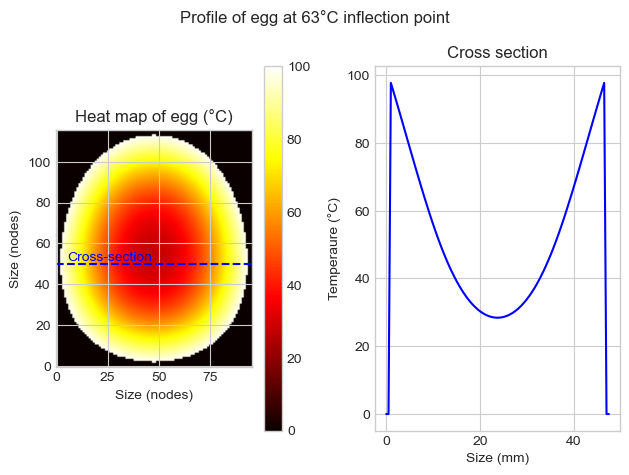

In [59]:
# Profile of egg at 63°C inflection point
index_reach_63 = np.argmax(y_000[4] >= 63)
crosssection_point = 50

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.text(5, crosssection_point, 'Cross-section', verticalalignment='bottom', horizontalalignment='left', color='b')
ax1.axhline(crosssection_point, linestyle='--', label='plot line', color='blue')
im1 = ax1.imshow(data_000[index_reach_63,].T, cmap='hot', vmin=0, vmax=100, origin='lower') # Transpose needed as array is [i,j] not [x,y]
# ax1.legend()
ax1.set_xlabel('Size (nodes)')
ax1.set_ylabel('Size (nodes)')
ax1.set_title('Heat map of egg (°C)')
fig.colorbar(im1, ax=ax1) 

x_data = np.zeros(np.size(data_000,1))
y_data = np.zeros_like(x_data)
for i in range(np.size(x_data)):
    x_data[i] = i * dx
    y_data[i] = data_000[index_reach_63, i, crosssection_point]
ax2.plot(x_data, y_data, 'b-')
ax2.set_title('Cross section')
ax2.set_xlabel('Size (mm)')
ax2.set_ylabel('Temperaure (°C)')
# ax2.axvline((np.max(x_data) - yoke_width)/2, linestyle='-.')
# ax2.axvline((np.max(x_data) + yoke_width)/2, linestyle='-.')
# ax2.text((np.max(x_data) - yoke_width)/2 + 0.5, 95, 'Yoke-white\ninterface', verticalalignment='center', horizontalalignment='left', color='k')

fig.suptitle('Profile of egg at 63°C inflection point')

plt.tight_layout()
plt.show()


<p style="text-align: center; font-style: italic; font-size: 14px">
    <b style="color: #d9230f">Figure 5. Heat map and cross-section of egg at 63°C inflection point.</b><br>
    Heat map shows 0°C boundary condition simulating egg's submersion into ice water. The profile shows the center of the yolk ≈ 30°C.
</p>

In [131]:
ani = None
count = 0
images = []

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.axhline(crosssection_point, linestyle='--', label='plot line', color='blue')
ax2.set_ylim(-5, 105)

frames = np.arange(0, np.size(data_000, 0), 350)
x_data = frames * dt
y_data = np.empty((np.size(y_label), np.size(x_data)))
y_data[:, :] = np.nan

for n in range(np.size(y_data, 1)):  
    img = ax1.imshow(data_000[frames[n]].T, cmap='hot', vmin=0, vmax=100, animated=True, origin='lower')  

    line_art = None
    # x_data[n] = frames[n] * dt
    # for i in range(np.size(y_data, 0)):
    for i in range(np.size(y_label)):
        y_data[i, n] = y_000[i, frames[n]]
        
    line_art0, = ax2.plot(x_data, y_data[0], y_colour[0], label=y_label[0], animated=True)
    line_art1, = ax2.plot(x_data, y_data[1], y_colour[1], label=y_label[1], animated=True)
    line_art2, = ax2.plot(x_data, y_data[2], y_colour[2], label=y_label[2], animated=True)
    line_art3, = ax2.plot(x_data, y_data[3], y_colour[3], label=y_label[3], animated=True)
    line_art4, = ax2.plot(x_data, y_data[4], y_colour[4], label=y_label[4], animated=True)
    fill_art   = ax2.fill_between(x_data, y_data[3], y_data[4], facecolor='grey', alpha=0.5, animated=True)

    images.append([img, line_art0, line_art1, line_art2, line_art3, line_art4, fill_art])
    count += 1
    print(f"count: {count}\r", end='')

# plt.tight_layout()
ani = animation.ArtistAnimation(fig, images, interval=50, blit=True, repeat_delay=2000)

plt.close()
HTML(ani.to_jshtml())

In [130]:
ani = None
count = 0
images = []

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.axhline(crosssection_point, linestyle='--', label='plot line', color='blue')

for n in range(0, np.size(data_000,0), 350):  
    img = ax1.imshow(data_000[n].T, cmap='hot', vmin=0, vmax=100, animated=True, origin='lower')  

    x_data = np.zeros(np.size(data_000,1))
    y_data = np.zeros_like(x_data)
    for i in range(np.size(x_data)):
        x_data[i] = i * dx
        y_data[i] = data_000[n, i, crosssection_point]
    line_art, = ax2.plot(x_data, y_data, 'b-', animated=True)
    # ax2.axvline(20, linestyle='--', animated=True)
    # ax2.axvline(40, linestyle='--', animated=True)

    images.append([img, line_art])
    count += 1
    print(f"count: {count}\r", end='')

# plt.tight_layout()
ani = animation.ArtistAnimation(fig, images, interval=50, blit=True, repeat_delay=1000)

plt.close()
HTML(ani.to_jshtml())

# Conclude


## Further work

* Parameter analysis (sensitivity)
* Conclude on operating window
* Egg fitting algorithm - image analysis
* Egg size

## References

[1]: https://www.sciencedirect.com/science/article/pii/S2665927124001989 - Modeling of cooking and phase change of egg white using computational fluid dynamics. R E. Sánchez-García et al. 2024

[2]: https://www.nature.com/articles/s44172-024-00334-w - Periodic cooking of eggs. E D. Lorenzo et al. 2025

[3]: https://math.arizona.edu/~gabitov/teaching/141/math_485/Final_Presentations/Cooking_Final_Presentation.pdf - Numerical Modeling of Diffusion and Phase Transitions in Heterogeneous Media. H. Jeffrey. 

[4]: https://tokusen.store/en/blogs/recipes/ajitsuke-tamago-oeufs-marines-a-la-japonaise?srsltid=AfmBOop-R7FBSF8x4BBuf1P6eeOMCkhl4dBXGh3gvz_CM9kgHepp4Yd1 - Japanese Ramen Eggs (Ajitsuke Tamago). Tokusen [website]. 2025.

[4]: https://khymos.org/2009/04/09/towards-the-perfect-soft-boiled-egg/ - Towards the perfect soft boiled egg, M. Lersch. 2009

[5]: https://www.sciencedirect.com/science/article/pii/S0032579124006485 - Comparison of egg-shape equations using relative curvature measures of nonlinearity. M. Lain et al. 2024

[6]: https://newton.ex.ac.uk/teaching/CDHW/egg/ - 

[7]: https://www.sciencedirect.com/science/article/pii/S2665927124001989 - 

[8]: https://www.researchgate.net/figure/Thermal-properties-of-egg-components_tbl1_256804375 - 

[9]: https://www.engineeringtoolbox.com/food-thermal-conductivity-d_2177.html - 

[10]: https://newton.ex.ac.uk/teaching/CDHW/egg/CW061201-1.pdf - 

# Appendix

### Notes from Lecture videos

Definition of a derivative
$$ \left. \frac{df(x)}{dx} \right|_{x=0} = f'(a)=\lim_{x \to 0}\frac{f(x)-f(a)}{x-a} $$

Forward difference:
$$ \left. \frac{df(x)}{dx} \right|_{x_i} \approx \frac{f(x_{i+1})-f(x_i)}{x_{i+1}-x_i} $$

Backward difference:
$$ \left. \frac{df(x)}{dx} \right|_{x_i} \approx \frac{f(x_i)-f(x_{i-1})}{x_i-x_{i-1}} $$

Central difference:
$$ \left. \frac{df(x)}{dx} \right|_{x_i} \approx \frac{f(x_{i+1})-f(x_{i-1})}{x_{i+1}-x_{i-1}} $$

### Taylor series

* Assume all nodes/points are equally spaced i.e. h is constant

$$ f(x_{i+1}) = f(x_i) + hf'(x_i) + \frac{1}{2!}h^2f''(x_i) + \frac{1}{3!}h^3f'''(x_i) + \frac{1}{4!}h^4f''''(x_i) + ... $$

$$ f(x_{i+1}) = f(x_i) + hf'(x_i) + \frac{1}{2!}h^2f''(x_i) + ... + \left. \frac{1}{n!}h^n \frac{d^nf}{x^n} \right|_{x_i} + R_n \xi $$

where $\xi$ is an unknown location between $x_i \ge \xi \ge x_{i+1}$ and we cannot calculate $\xi$.


Using the first 2 terms of the Taylor's Series for $f(x_{i+1})$

$$ f(x_{i+1}) = f(x_i) + hf'(x_i) + \frac{1}{2!}h^2f''(\xi) $$

Solve for $f'(x_{i+1})$:
$$ f'(x_{i+1}) = \frac{f(x_{i+1})-f(x_i)}{h} - \frac{1}{2!}hf''(\xi) = \frac{f(x_{i+1})-f(x_i)}{h} - error $$

Note: As the value of $h$ gets smaller the $error$ is smaller:
$$ error = \frac{f''(\xi)}{2}h $$
This is also a __first order__ method (order of h given to the truncation error)

## General 1D diffusion problem
Diffusion type systems have a general form of:
$$
    \frac{\delta u}{\delta t} = \alpha \frac{\delta^2 u}{\delta x^2} + f
$$

The forward Euler model [^1], the space domain is defined with the following nodes:
$$
    x_i = i\Delta x, i = 0,...,N_x
$$
and the time domain is defines as:
$$
    t_n = n \Delta t, n = 0,...,N_t
$$

So, considering the general diffusion system notes above, $u(x_i, t_n)$ can be denoted as $u^n_i$. Thus, the general diffusion system becomes:
$$
    \frac{\delta}{\delta t}u(x_i, t_n) = \alpha \frac{\delta^2}{\delta x^2} u(x_i, t_n)
$$

The solution to a 2^nd order finite difference approximation can be derived by combining 2 Taylor series, this results in a forward difference in time and a central difference in space:
$$
    \frac{u_i^{n+1} - u_i^n}{\Delta t} = \alpha \frac{u_{i+1}^n - 2u_i^n +u_{i-1}^n}{\delta x^2} + Err_{trunc}(dx^2)
$$

Where the truncation error ($Err_{trunc}$) can be seen to be 2^nd order. Rearranging this with respect to the unknown $u_i^{n+1}$:
$$
    u_i^{n+1} = u_i^n + F(u_{i+1}^n - 2u_i^n + u_{i-1}^n) +\Delta t.Err_{trunc}(dx^2)
$$
where:
$$
    F = \alpha \frac{\Delta t}{\Delta x^2}
$$

> [!Note]
> F is the __Fourier Number__, a dimensionless value that represents the physical parameters of the diffusion problem in $\alpha$ and the discretised parameters $\Delta x$ and $\Delta t$.

[^1]: Finite difference methods for diffusion processes. H. P. Langtangen, S. Linge. 2016 July 14

## General 2D diffusion problem
Diffusion type systems in 2D have a general form of:
$$
    \frac{\delta u}{\delta t} = \alpha (\frac{\delta^2 u}{\delta x^2} + \frac{\delta^2 u}{\delta i^2}) 
$$
For the 2D problem we add another dimension:
$$
    y_j = j\Delta i, j = 0,...,N_y
$$
So our 2D diffusion system, $u(x_i, y_j, t_n)$ can be denoted as $u^n_{i,j}$, thus:
$$
    u_i^{n+1} = u_{i,j}^n + F_x(u_{i+1,j}^n - 2u_{i,j}^n + u_{i-1,j}^n) + F_y(u_{i,j+1}^n - 2u_{i,j}^n + u_{i,j-1}^n)
$$
where:
$$
    F_x = \alpha \frac{\Delta t}{\Delta x^2}, F_y = \alpha \frac{\Delta t}{\Delta i^2}
$$
If we assume $\Delta x = \Delta i$, the 2D solution can be simplified to:
$$
    u_i^{n+1} = u_{i,j}^n + F(u_{i+1,j}^n + u_{i-1,j}^n + u_{i,j+1}^n + u_{i,j-1}^n - 4u_{i,j}^n) 
$$
where:
$$
    F = \alpha \frac{\Delta t}{\Delta x^2}
$$

## Simulation

...

In [80]:
""""
Function for solving diffusion system in 2D using finite difference method.

This function has the addition of:
 - Variable alpha values for diffusion coefficient
"""
import numpy as np

def solve_diffusion_2d_vAlpha(nx, ny, dx, dy, dt, nt, alpha, u0):
    """
    Solve the 2D diffusion equation using finite difference method.

    Parameters:
    nx : int
        Number of grid points in x direction.
    ny : int
        Number of grid points in i direction.
    dx : float
        Grid spacing in x direction.
    dy : float
        Grid spacing in i direction.
    dt : float
        Time step size.
    nt : int
        Number of time steps to simulate.
    alpha : 2D array
        Diffusion coefficient.
    u0 : 2D array
        Initial condition for the diffusion equation.

    Returns:
    u : 3D array (t, x, i)
        All solutions from t = 0 to nt time steps.
    """
    # Check stability condition - using max alpha for worst case
    if dt > (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2)):
        dt_max = (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2))
        alpha_max = (dx**2 * dy**2) / (2 * dt * (dx**2 + dy**2))
        raise ValueError("Time step size dt is too large for stability. Maximum dt: ", dt_max, " or reduce alpha to: ", alpha_max)
    
    u = np.zeros((nt, nx, ny))  # Initialize the solution array
    u[0, :, :] = u0  # Set initial condition
    for n in range(1, nt):
        # Reset boundary conditions at each time step
        u[n, 0, :] = u0[0, :]       # Left boundary
        u[n, -1, :] = u0[-1, :]     # Right boundary
        u[n, :, 0] = u0[:, 0]       # Bottom boundary
        u[n, :, -1] = u0[:, -1]     # Top boundary  
        # Iterate over internal grid points
        for i in range(1, nx-1):    
            for j in range(1, ny-1):
                u[n, i, j] = (u[n-1, i, j] + 
                               alpha[i, j] * dt * ((u[n-1, i+1, j] - 2*u[n-1, i, j] + u[n-1, i-1, j]) / dx**2 +
                                              (u[n-1, i, j+1] - 2*u[n-1, i, j] + u[n-1, i, j-1]) / dy**2))
    return u

### Variable diffusion coefficient

As mentioned in the above, the properties of the egg (white & yolk) change with temperature, this including their effective thermal diffusion coefficient. 

In [81]:
# Check diffusion coefficient

# https://newton.ex.ac.uk/teaching/CDHW/egg/
density_1 = 1.028   # g / cm^3
conduc_1  = 5.4e-3  # W /cm / K
capaci_1  = 3.7     # J /g /K
diffCo_1  = conduc_1 / (density_1 * capaci_1)   # cm^2 / s
diffCo_1  = diffCo_1 * 100  # mm^2 /s
print(diffCo_1)

# https://www.sciencedirect.com/science/article/pii/S2665927124001989
print(1e6 * 0.31 / (1100 * 3700)) # yolk
print(1e6 * 0.48 / (1134 * 3800)) # white


print(1e6 * 0.6 / (1023 * 2600))
print(1e6 * 0.4 / (1143 * 3700))

# https://www.researchgate.net/figure/Thermal-properties-of-egg-components_tbl1_256804375
print(1e6 * 0.3370  / (1036 * 2093)) # yolk
print(1e6 * 0.3370  / (1036 * 3266)) # yolk
print(1e6 * 0.59 / (1036 * 2093))        # white
print(1e6 * 0.59 / (1036 * 3935))        # white

# https://www.engineeringtoolbox.com/food-thermal-conductivity-d_2177.html
# conduct 0.58 white, 0.34 yolk
# cap 3180


print(1e6 * 0.34 / (1036 * 3266))        
print(1e6 * 0.58 / (1134 * 3000))        

# https://newton.ex.ac.uk/teaching/CDHW/egg/CW061201-1.pdf
print(1e6 * 0.34 / (1032 * 2700))        # Yolk
print(1e6 * 0.54 / (1038 * 3700))        # White

0.14197076453885793
0.07616707616707617
0.1113895850737956
0.22558087074216107
0.09458277174812608
0.15541785728121132
0.09959876769429739
0.27209654538847083
0.1447263200757483
0.10048540360848995
0.17048794826572605
0.1220212460522538
0.14060303077644118


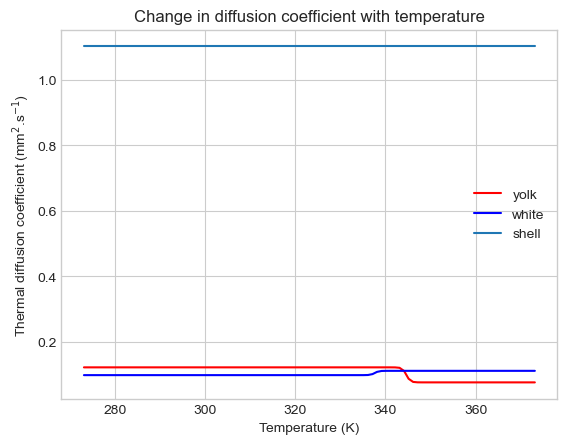

In [82]:
# Modelling thermal coefficient as function of temperature (coagulation)
import numpy as np
import matplotlib.pyplot as plt

def thermal_diffusion(conductivity, density, capacity):
    """Return thermal diffusion coefficient

    Args:
        conductivity (float): thermal conductivity (k, W m-1 K-1)
        density (float): density ('rho', kg m-3) 
        capacity (float): heat capacity (c, J kg-1 K-1)

    Returns:
        float: thermal diffusion ('alpha', m2 / s)
    """
    return conductivity / (density * capacity)

def logistic(L, k, x, x0, y0):
    """Return logistic data

    Args:
        L (float): supremum (end value)
        k (float): growth rate (logistic)
        x (array, float): x value(s)
        x0 (float): mid-point
        y0 (float): i intercept
    """
    return (L - y0) / (1 + np.exp(-k*(x - x0))) + y0

def diffusion_coefficient_mm2(T, material, width=0.001):
    
    L = thermal_diffusion(material["conductivity"][0], material["density"][0], material["capacity"][0])
    k = np.log((1-width)/width) / material["interval_K"]
    x0 = material["chang_T"] + material["interval_K"]/2
    y0 = thermal_diffusion(material["conductivity"][1], material["density"][1], material["capacity"][1])
    return (1e6 * logistic(L, k, T, x0, y0))

# Data from https://www.sciencedirect.com/science/article/pii/S2665927124001989

yolk = {
    "density": [1100, 1032],        # kg m-3, [liquid, solid]
    "conductivity": [0.31, 0.34],   # W m-1 K-1
    "capacity": [3700, 2700],       # J kg-1 K-1
    "chang_T": 343.15,              # K
    "interval_K": 3,                # K
    "latent":12.2                   # KJ kg-1
}

white = {
    "density": [1134, 1100],        # kg m-3, [liquid, solid]
    "conductivity": [0.48, 0.40],   # W m-1 K-1
    "capacity": [3800, 3700],       # J kg-1 K-1
    "chang_T": 336.15,              # K
    "interval_K": 3,                # K
    "latent":12.2                   # KJ kg-1
}

shell = {
    "density": [2300, 2300],        # kg m-3, [solid, solid] <- this is N/A
    "conductivity": [2.25, 2.25],   # W m-1 K-1
    "capacity": [888, 888],         # J kg-1 K-1
    "chang_T": 1,                   # K <- N/A
    "interval_K": 1,                # K <- N/A
    "latent": 0                     # KJ kg-1 <- N/A
}

# yolk["diffusion"] = [thermal_diffusion(yolk["conductivity"][0], yolk["density"][0], yolk["capacity"][0])]
# yolk["diffusion"].append(thermal_diffusion(yolk["conductivity"][1], yolk["density"][1], yolk["capacity"][1]))
# white["diffusion"] = [thermal_diffusion(white["conductivity"][0], white["density"][0], white["capacity"][0])]
# white["diffusion"].append(thermal_diffusion(white["conductivity"][1], white["density"][1], white["capacity"][1]))
# shell["diffusion"] = [thermal_diffusion(shell["conductivity"][0], shell["density"][0], shell["capacity"][0])]
# shell["diffusion"].append(thermal_diffusion(shell["conductivity"][1], shell["density"][1], shell["capacity"][1]))

# Plot diffusion coefficeint vs temperature, assume sigmodal change in coefficient
T =  np.linspace(273.15, 273.15 + 100, 101)

# Assume a logistic change (fairly linear), with curve width (3K) fitting the 0.1% to 99.9% window
# yolk_diffusion = logistic(yolk["diffusion"][1], np.log(0.999/0.001) / yolk["interval_K"], T, yolk["chang_T"] + yolk["interval_K"]/2, yolk["diffusion"][0])
# white_diffusion = logistic(white["diffusion"][1], np.log(0.999/0.001) / white["interval_K"], T, white["chang_T"] + white["interval_K"]/2, white["diffusion"][0])
# shell_diffusion = logistic(shell["diffusion"][1], np.log(0.999/0.001) / shell["interval_K"], T, shell["chang_T"] + shell["interval_K"]/2, shell["diffusion"][0])

fig, ax = plt.subplots()
ax.plot(T, diffusion_coefficient_mm2(T, yolk), label="yolk", color='red')
ax.plot(T, diffusion_coefficient_mm2(T, white), label="white", color='blue')
plt.plot(T, diffusion_coefficient_mm2(T, shell), label="shell")
ax.legend()
ax.set_title("Change in diffusion coefficient with temperature")
ax.set_xlabel("Temperature (K)")
ax.set_ylabel("Thermal diffusion coefficient (mm$^2$.s$^{-1}$)")

plt.style.use('seaborn-v0_8-whitegrid')
plt.show()



The above plot shows how the diffusion coefficient changes as temperature increases. It can be noted that:

* The shell had a constant thermal diffusion coefficient
* The white's thermal diffusion coefficient decreases at the 63℃ transition temperature
    - Note: This is assumed to be the transition due to the denaturing of the ovotransferrin protein as the later denaturing is not until 80℃.
    - Therefore further change in diffusion coefficient > 80℃ are not covered in the data for this model.
* The yolk's thermal diffusion coefficient increases at the 70℃ transition temperature.

In [83]:
""""
Function for solving diffusion system in 2D using finite difference method.

This function has the addition of:
 - Variable alpha values for diffusion coefficient
"""
import numpy as np

def solve_diffusion_2d_vAlpha(nx, ny, dx, dy, dt, nt, alpha, u0):
    """
    Solve the 2D diffusion equation using finite difference method.

    Parameters:
    nx : int
        Number of grid points in x direction.
    ny : int
        Number of grid points in i direction.
    dx : float
        Grid spacing in x direction.
    dy : float
        Grid spacing in i direction.
    dt : float
        Time step size.
    nt : int
        Number of time steps to simulate.
    alpha : 2D array
        Diffusion coefficient.
    u0 : 2D array
        Initial condition for the diffusion equation.

    Returns:
    u : 3D array (t, x, i)
        All solutions from t = 0 to nt time steps.
    """
    # Check stability condition - using max alpha for worst case
    if dt > (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2)):
        dt_max = (dx**2 * dy**2) / (2 * alpha.max() * (dx**2 + dy**2))
        alpha_max = (dx**2 * dy**2) / (2 * dt * (dx**2 + dy**2))
        raise ValueError("Time step size dt is too large for stability. Maximum dt: ", dt_max, " or reduce alpha to: ", alpha_max)
    
    u = np.zeros((nt, nx, ny))  # Initialize the solution array
    u[0, :, :] = u0  # Set initial condition
    for n in range(1, nt):
        # Reset boundary conditions at each time step
        u[n, 0, :] = u0[0, :]       # Left boundary
        u[n, -1, :] = u0[-1, :]     # Right boundary
        u[n, :, 0] = u0[:, 0]       # Bottom boundary
        u[n, :, -1] = u0[:, -1]     # Top boundary  
        # Iterate over internal grid points
        for i in range(1, nx-1):    
            for j in range(1, ny-1):
                u[n, i, j] = (u[n-1, i, j] + 
                               alpha[i, j] * dt * ((u[n-1, i+1, j] - 2*u[n-1, i, j] + u[n-1, i-1, j]) / dx**2 +
                                              (u[n-1, i, j+1] - 2*u[n-1, i, j] + u[n-1, i, j-1]) / dy**2))
    return u

In [84]:
# Test alpha_grid

import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.cm as cm
import time as time
from IPython.display import HTML
import numpy as np

initial_condition = np.ones_like(alpha_grid) * 25   # All start at 25 degrees
initial_condition[np.where(alpha_grid == 0)] = 100

# dt = 0.00625
nt = 480

start_time = time.time()
test = solve_diffusion_2d_vAlpha(np.size(alpha_grid, 1), np.size(alpha_grid, 0), 
                                 dx, dy, dt, nt, alpha_grid.T, initial_condition.T)
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time for solution: {elapsed_time:.2f} seconds.\n Time simulated: {dt * nt} seconds.")

# fig, (ax1, ax2) = plt.subplots(1, 2)
# images = []

# ax1.axhline(45, linestyle=':', label='plot line')
# im1 = ax1.imshow(test[-1].T, cmap='hot', vmin=25, vmax=100, origin='lower')
# ax1.legend()
# fig.colorbar(im1, ax=ax1) 

# y_data = np.zeros(np.size(test,1))
# x_data = np.zeros_like(y_data)
# for j in range(np.size(test,1)):
#     x_data[j] = j * dx
#     y_data[j] = test[-1,j,45]
# ax2.plot(x_data, y_data, 'b-', animated=True)
# ax2.axvline(20, linestyle='--', animated=True)
# ax2.axvline(40, linestyle='--', animated=True)

# plt.show()

# plt.tight_layout()

# for i in range(100):
#     ax1.axhline(45, linestyle=':', label='test')
#     img = ax1.imshow(test[i*3].T, cmap='tab20', vmin=25, vmax=100, animated=True, origin='lower')  

#     y_data = np.zeros(np.size(test,1))
#     x_data = np.zeros_like(y_data)
#     for j in range(np.size(test,1)):
#         x_data[j] = j
#         y_data[j] = test[i,j,45]
#     line_art, = ax2.plot(x_data, y_data, 'b-', animated=True)
#     ax2.axvline(20, linestyle='--', animated=True)
#     ax2.axvline(40, linestyle='--', animated=True)

#     images.append([img, line_art])

# plt.tight_layout()
# ani = animation.ArtistAnimation(fig, images, interval=50, blit=True, repeat_delay=1000)

# HTML(ani.to_jshtml())

Elapsed time for solution: 8.31 seconds.
 Time simulated: 3.0 seconds.


## Stability
Add notes
$$
    \Delta t \leq \frac{\Delta x^2}{2\alpha}
$$